# Avocado Dataset Final Project

We first load the necessary libraries and the avocado dataset. And check the [description](https://www.kaggle.com/datasets/neuromusic/avocado-prices) of the dataset to understand its features.

Some relevant columns in the dataset:

- Date: The date of the observation
- AveragePrice: the average price of a single avocado
- type: conventional or organic
- year: the year
- Region: the city or region of the observation
- Total Volume: Total number of avocados sold
- 4046: Total number of avocados with PLU 4046 sold
- 4225: Total number of avocados with PLU 4225 sold
- 4770: Total number of avocados with PLU 4770 sold

> PLU codes for avocados are Price Look-Up codes on stickers that identify the fruit's type and size for retailers. Common non-organic Hass avocado PLU codes are 4046 (small/medium), 4225 (large), and 4770 (extra-large). Organic Hass avocados have the same PLU codes but with a prefix of 9 (e.g., 94046 for small/medium organic Hass avocados).

> Sadly the dataset does not provide total volume available in the market, only total volume sold so we cannot compute supply-demand metrics.

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# make plots appear in the notebook
%matplotlib inline
# %matplotlib notebook make plots interactive
sns.set_theme(style="darkgrid")
    
df = pd.read_csv("datasets/avocado.csv")

## Avocados dataset EDA Report

A quick exploratory data analysis (EDA) report of the avocado dataset shows the following insights:

In [105]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Avocados Dataset EDA Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 101.21it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observations about the dataset:
- The dataset contains a column Unnamed: 0 which is just an index column and can be dropped.
- There are **no missing values NaN** in the dataset.
- All features are of appropriate data types, but **DateTime should be converted to a datetime object**.
- The **data is mostly from 2015 to 2017 with a good distribution** across the years. But only a **few data points on 2018**.
- Type feature has two categories: conventional and organic, with equally distributed data points.

Core insights from the data:
- Average price is **right-skewed**, with most prices between $1.00 and $1.50, and a few higher-priced avocados.
- **Correlation between type and average price, with organic avocados generally being more expensive**.
- **Correlation total volume and total bags as expected**.
- **XLarge bags has zeroes in many rows**, 66%. **It seems to indicate that the bag size is less used**.
- **4770 PLU code (Extra-large variety) has many zeroes**, 30%. **It seems to indicate that this variety is less popular**.

We can also do it the old way

In [106]:
print(df.dtypes)
# df.info()
# df.describe()
df.isnull().sum()
print("##################")
avocado_types = df['type'].unique()
num_regions = len(df['region'].unique())
print(f"Avocado types: {avocado_types}")
print(f"Number of unique regions: {num_regions}")
print(f"Shape of the dataset: {df.shape}")

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object
##################
Avocado types: ['conventional' 'organic']
Number of unique regions: 54
Shape of the dataset: (18249, 14)


We apply the mentioned fixes.

In [107]:
# Drop the 'Unnamed: 0' column as it is just an index
df = df.drop(columns=['Unnamed: 0'])
# Convert 'Date' to datetime
df['Date'] = pd.to_datetime(df['Date'])
df.head()


,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


## Price Distribution

We check price distribution.

Text(0.5, 0, 'Average Price')

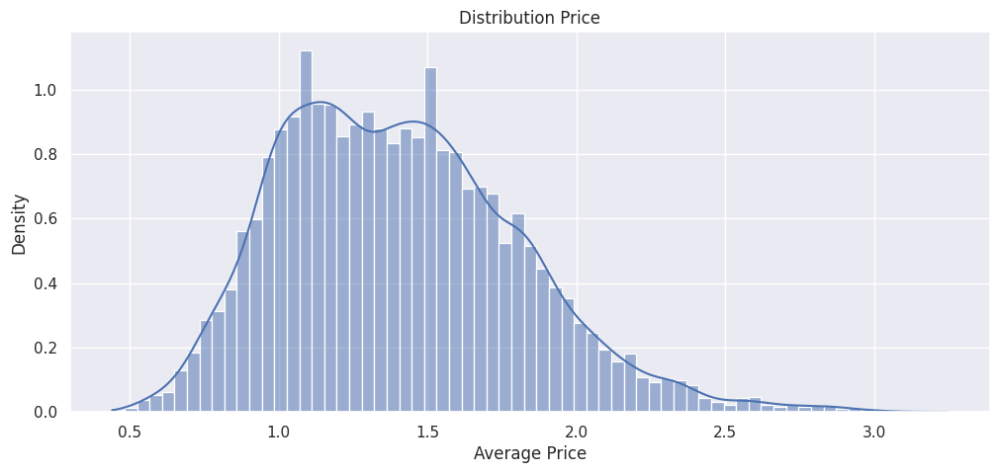

In [108]:
plt.figure(figsize=(12, 5))
plt.title('Distribution Price')
# kde: kernel density estimate. It is a way to estimate the probability density function of a continuous random variable.
# This is often preferred over traditional histograms because it produces a smoother output and avoids the arbitrary binning of histograms
ax = sns.histplot(df['AveragePrice'], kde=True, stat="density")
ax.set_xlabel('Average Price')
# kde=True adds a smooth curve approximating the density.
# stat="density" scales the histogram bars so their total area = 1.
# This allows comparison with the density curve. Otherwise, the histogram shows counts / frequencies.

A density curve helps you visualize the distribution, central tendency, spread, and probabilities of a dataset.

1. Shape of Distribution: You can see if it is symmetric, skewed to the right (high prices), or skewed to the left (low prices).

2. Central Tendency: The peak of the density curve indicates the most common price range, giving insights into the average price. For symmetric distributions, the mean and median are close together. For skewed distributions, the mean is pulled in the direction of the skew.

3. Spread: The width of the curve indicates the variability in prices. A wider curve suggests more variability, while a narrower curve indicates that prices are more consistent.

4. Probabilities: The area under the curve between two points represents the probability of prices falling within that range. This is useful for understanding the likelihood of certain price levels.

5. Outliers: You can identify potential outliers or extreme values that fall far from the main cluster of data.

> You can compare this curve with curves from other time periods, regions, or types of avocados to see how prices vary across different conditions.

We can see that most prices are between 1 and 1.5 dollars. And the distribution is slightly right-skewed, indicating a few higher-priced avocados.
We can validate this by calculating the three measures of central tendency.

In [109]:
# Average of all prices sum of prices / number of prices
mean_price = df['AveragePrice'].mean()
# Middle value in the sorted list
median_price = df['AveragePrice'].median()
# Most frequently occurring value
mode_price = df['AveragePrice'].mode()[0]
print(f'Mean Average Price: {mean_price:.2f}')
print(f'Median Average Price: {median_price:.2f}')
print(f'Mode Average Price: {mode_price:.2f}')

Mean Average Price: 1.41
Median Average Price: 1.37
Mode Average Price: 1.15


The mean is slightly higher than the median and mode, confirming the right skewness observed in the distribution plot.

We will calculate the Shapiro-Wilk test to assess the normality of the AveragePrice distribution.

In [110]:
from scipy import stats
stat, p = stats.shapiro(df['AveragePrice'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Data looks normal (fail to reject H0)')
else:
    print('Data does not look normal (reject H0)')


Statistics=0.979, p=0.000
Data does not look normal (reject H0)


/home/javier/Documents/IA/IA learning/lab1/.venv/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18249.
  res = hypotest_fun_out(*samples, **kwds)


But as the warning says is not appropriate for large datasets. So we will use Anderson-Darling test instead, which is more suitable for larger datasets.

In [111]:
from scipy.stats import anderson

result = anderson(df['AveragePrice'], dist='norm')
print("Statistic:", result.statistic)
for sl, cv in zip(result.significance_level, result.critical_values):
    if result.statistic < cv:
        print(f"At {sl}%: Data looks normal")
    else:
        print(f"At {sl}%: Data does NOT look normal")


Statistic: 79.33101334098683
At 15.0%: Data does NOT look normal
At 10.0%: Data does NOT look normal
At 5.0%: Data does NOT look normal
At 2.5%: Data does NOT look normal
At 1.0%: Data does NOT look normal


So we can conclude that the average price of avocados is around $1.20, with most prices falling between $1.00 and $1.50. The distribution is slightly right-skewed, indicating that while most avocados are priced in this range, there are some higher-priced avocados that pull the average up slightly above the median and mode.

We can estimate the probabibilities of an avocado being below $1.00, between $1.00 and $1.50, and above $1.50 by calculating the proportion of data points that fall within these ranges.

In [112]:
prob_below_100 = (df['AveragePrice'] < 1.00).mean()
print(f'Probability of an avocado below $1.00: {prob_below_100:.2%}')
prob_between_100_150 = ((df['AveragePrice'] >= 1.00) & (df['AveragePrice'] <= 1.50)).mean()
print(f'Probability of an avocado between $1.00 and $1.50: {prob_between_100_150:.2%}')
prob_above_150 = (df['AveragePrice'] > 1.50).mean()
print(f'Probability of an avocado above $1.50: {prob_above_150:.2%}')

Probability of an avocado below $1.00: 15.32%
Probability of an avocado between $1.00 and $1.50: 46.80%
Probability of an avocado above $1.50: 37.88%


Instead of calculating probabilities manually, we can use the Empirical Cumulative Distribution Function (ECDF) to get these probabilities directly from the data.
> We don't use the normal distribution here because the data is not normally distributed as we saw before.

CDF at 1.5: 0.6212395199736972
CDF at 1: 0.16236506109923832
Probability X < 1: 15.32%
Probability 1 <= X <= 1.5: 46.80%
Probability X > 1.5: 37.88%


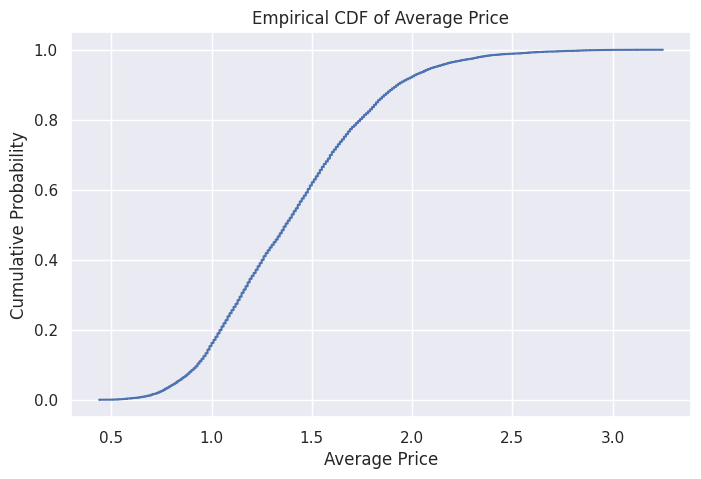

In [113]:
from statsmodels.distributions.empirical_distribution import ECDF

# Empirical Cumulative Distribution Function
ecdf = ECDF(df['AveragePrice'])
print(f"CDF at 1.5: {ecdf(1.5)}")  # P(X <= 1.5)
print(f"CDF at 1: {ecdf(1)}")      # P(X <= 1)
# 0.999999 to avoid including exactly 1.0 in the first probability
print(f"Probability X < 1: {ecdf(0.999999) * 100:.2f}%")
# We substract 0.999999 to avoid removing the probability of exactly 1.0
print(f"Probability 1 <= X <= 1.5: {(ecdf(1.5) - ecdf(0.999999)) * 100:.2f}%")
print(f"Probability X > 1.5: {(1 - ecdf(1.5)) * 100:.2f}%")

# or visually plot the CDF
plt.figure(figsize=(8, 5))
plt.step(ecdf.x, ecdf.y, where='post')
plt.title('Empirical CDF of Average Price')
plt.xlabel('Average Price')
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.show()


Let's see now average price, total volume and total bags trends over time.

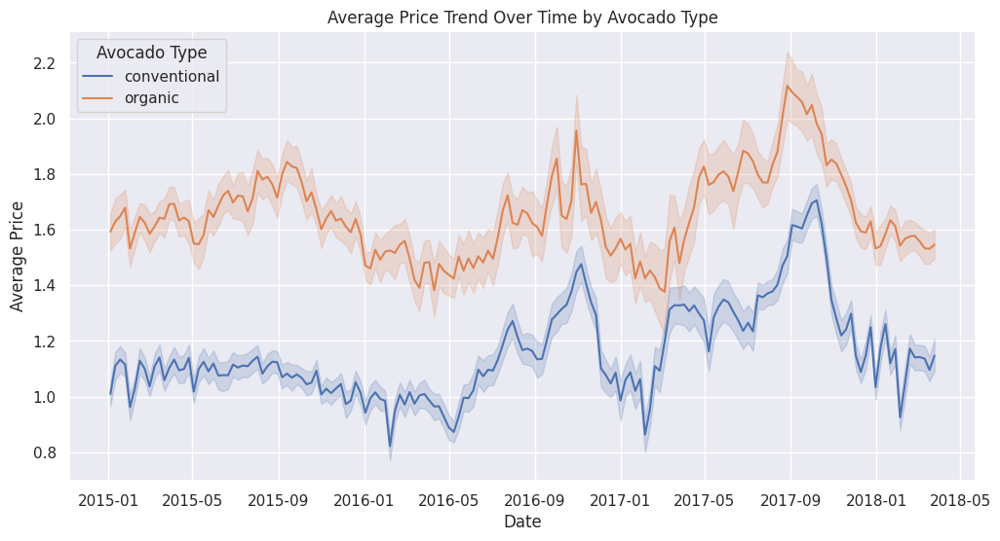

In [114]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='Date', y='AveragePrice', hue='type')
plt.title('Average Price Trend Over Time by Avocado Type')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.legend(title='Avocado Type')
plt.show()

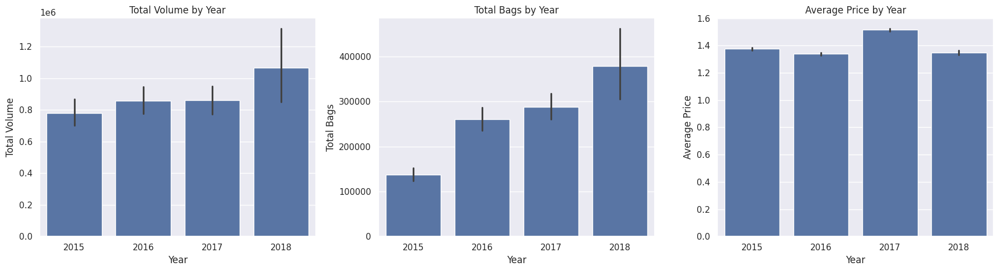

In [115]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
sns.barplot(x='year', y='Total Volume', data=df, ax=ax[0])
ax[0].set_title('Total Volume by Year')
ax[0].set_xlabel('Year')
ax[0].set_ylabel('Total Volume')
sns.barplot(x='year', y='Total Bags', data=df, ax=ax[1])
ax[1].set_title('Total Bags by Year')
ax[1].set_xlabel('Year')
ax[1].set_ylabel('Total Bags')
sns.barplot(x='year', y='AveragePrice', data=df, ax=ax[2])
ax[2].set_title('Average Price by Year')
ax[2].set_xlabel('Year')
ax[2].set_ylabel('Average Price')
plt.tight_layout()
plt.show()

We see an increase in average price during 2017-2018 period, with organic avocados being consistently more expensive than conventional ones. We also see an increase of total volume sold during this period, indicating a surge in demand for avocados. Total bags sold also shows an upward trend, reflecting the overall growth in avocado sales.

Next we will focus now in the avocado types and the surge in prices during 2017-2018 period.

## Type of Avocado vs Average Price

We can see now if the type of avocado (conventional vs. organic) has an impact on the average price by plotting boxplots for each type.

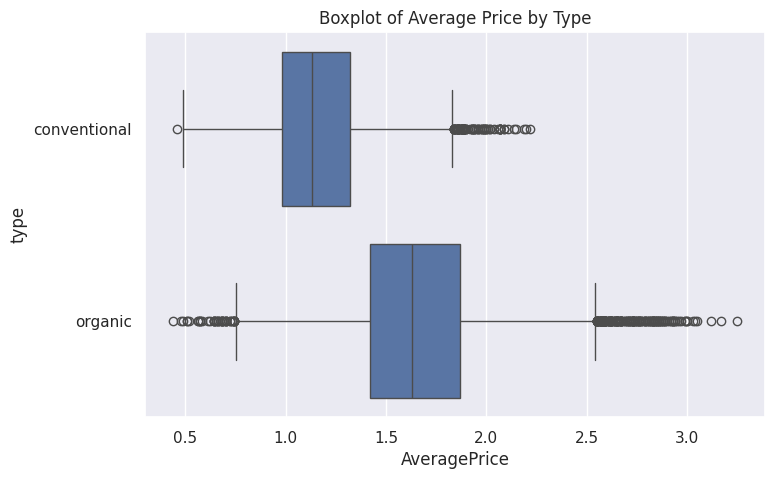

In [116]:
plt.figure(figsize=(8, 5))
plt.title('Boxplot of Average Price by Type')
ax = sns.boxplot(y="type", x="AveragePrice", data=df)

Yeah, organic avocados tend to have a higher average price compared to conventional ones. The median price for organic avocados is noticeably higher, and the interquartile range (IQR) for organic avocados is also shifted upwards compared to conventional avocados. This indicates that not only are organic avocados generally more expensive, but their prices also tend to be higher across the board.

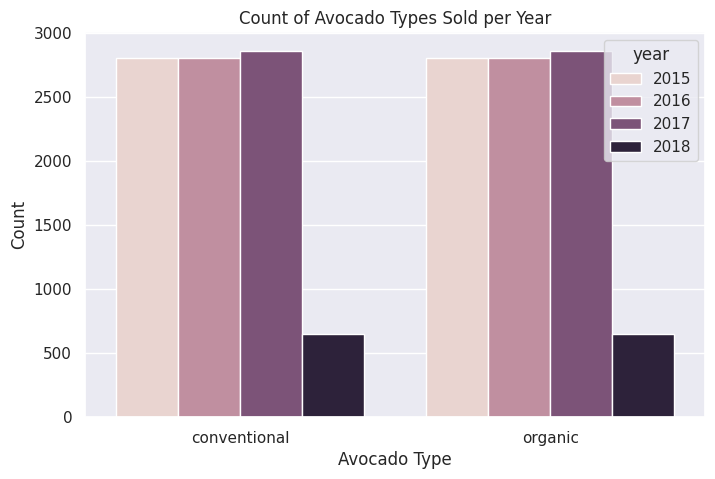

In [117]:
plt.figure(figsize=(8, 5))
plt.title('Count of Avocado Types Sold per Year')
ax = sns.countplot(x='type', hue='year', data=df)
ax.set_xlabel('Avocado Type')
ax.set_ylabel('Count')
plt.show()

We can see that both type of avocados are equally popular during the years.

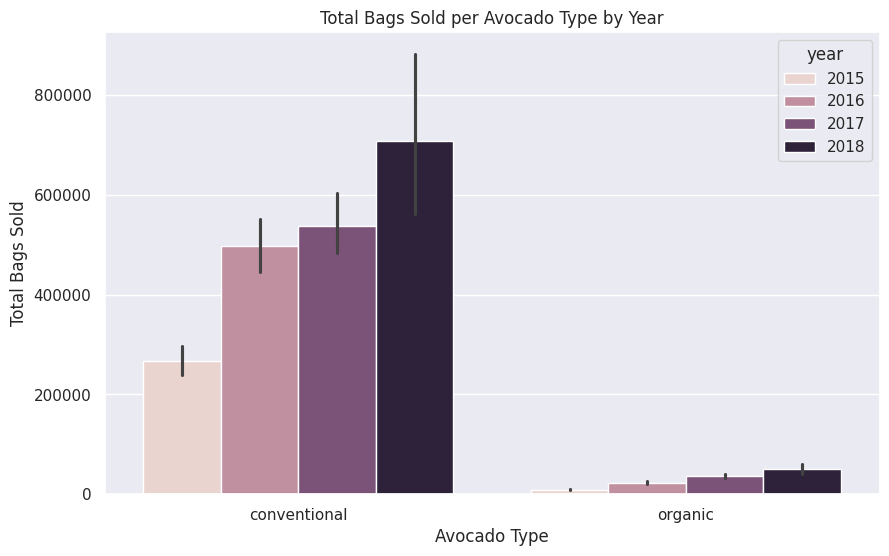

In [118]:
plt.figure(figsize=(10, 6))
sns.barplot(x='type', y='Total Bags', hue='year', data=df)
plt.title('Total Bags Sold per Avocado Type by Year')
plt.xlabel('Avocado Type')
plt.ylabel('Total Bags Sold')
plt.show()

Organic avocados buyers don't seem to buy bags, this could be because organic avocado buyers prefer to buy individual avocados rather than pre-packaged bags, possibly due to a preference for selecting their own fruit or a perception that bags may contain lower-quality avocados.

## Average Price by Region and Year

We can see now the impact of region on average price by plotting boxplots for each region. We will drop agglomeration regions to focus on specific ones.

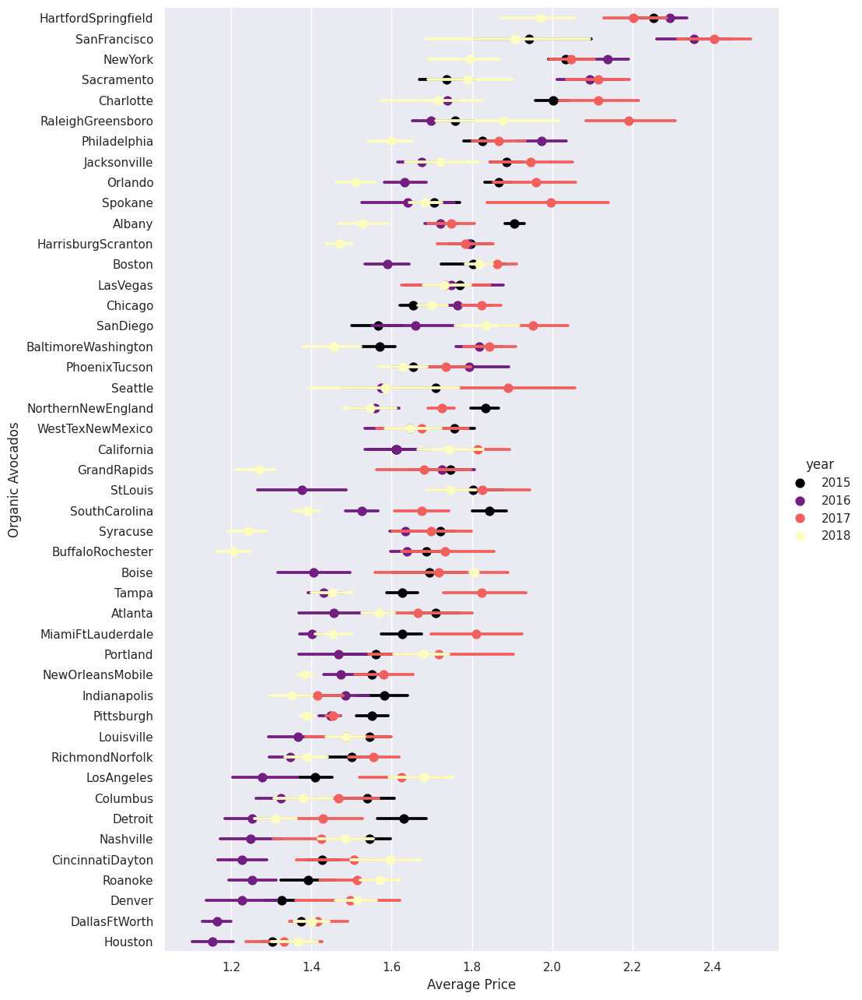

In [119]:
df_only_region = df[~df['region'].isin(['TotalUS', 'West', 'SouthCentral', 'Northeast', 'Southeast', 'Midsouth', 'Plains', 'GreatLakes'])]
mask = df_only_region['type'] == 'organic'
order = df_only_region[mask].groupby('region')['AveragePrice'].mean().sort_values(ascending=False).index
g = sns.catplot(
    x='AveragePrice',
    y='region',
    order=order,
    data=df_only_region[mask],
    hue='year',
    height=13,
    aspect=0.8,
    palette='magma',
    kind='point',
    linestyle='None',
)
g.set_axis_labels("Average Price", "Organic Avocados")

Observations:
- Looking at price we confirm that in all regions avocados were more expensive in 2017 compared to previous years.
> Avocado prices were high in the USA in 2017 due to a combination of surging demand and reduced supply caused by a poor harvest in Mexico and drought in California
- San Francisco, Hartford Springfield, Raileigh Greensboro and Charlotte regions have the highest average prices for organic avocados in 2017. Being San Francisco the one with the highest average price.
- During the same time period, Houston. Dallas FT Worth and South Central regions had the lowest average prices for organic avocados.

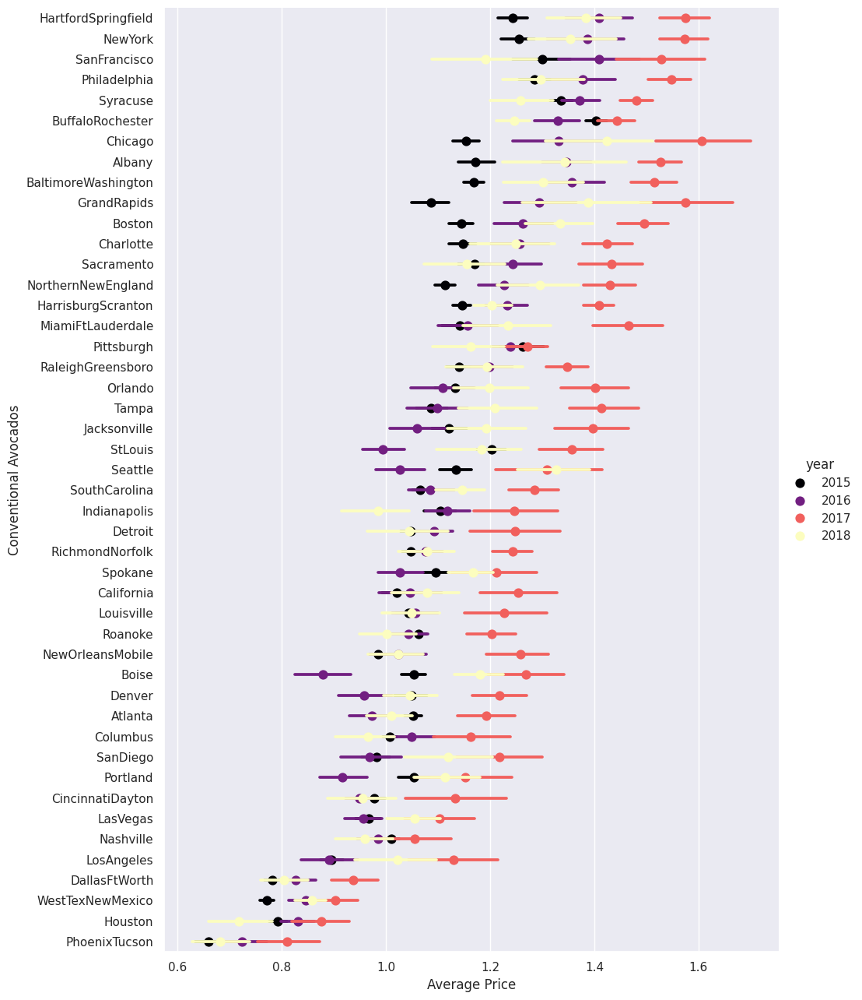

In [120]:
mask = df_only_region['type'] == 'conventional'
order = df_only_region[mask].groupby('region')['AveragePrice'].mean().sort_values(ascending=False).index
g = sns.catplot(
    x='AveragePrice',
    y='region',
    order=order,
    data=df_only_region[mask],
    hue='year',
    height=13,
    aspect=0.8,
    palette='magma',
    kind='point',
    linestyle='None',
)
g.set_axis_labels("Average Price", "Conventional Avocados")

Observations:
- Conventional avocados have lower average prices across all regions compared to organic avocados. But were also higher in 2017 compared to 2015 and 2016, but dropped in 2018.
- San Francisco, New York, Philadelphia, Hartford Springfield, Grand Rapids and Chicago regions have the highest average prices for conventional avocados in 2017. Being Chicago region the one with the highest average price.
- During the same time period, Phoenix Tucson, Houston and West Tex New Mexico regions had the lowest average prices for conventional avocados.

## Seasonality Analysis using TotalUS
We can see now the seasonality of avocado prices using the TotalUS region data.

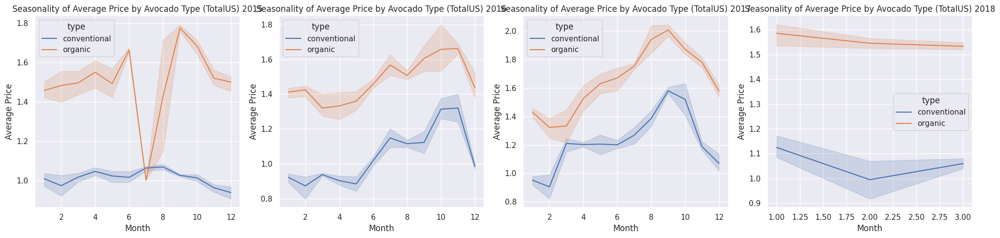

In [121]:
seasonal_df = df[df['region'] == 'TotalUS'].copy()
seasonal_df['Month'] = seasonal_df['Date'].dt.month
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i, year in enumerate(sorted(seasonal_df['year'].unique())):
    sns.lineplot(data=seasonal_df[seasonal_df['year'] == year], x='Month', y='AveragePrice', hue='type', ax=ax[i], markers=True, dashes=False)
    ax[i].set_title(f'Seasonality of Average Price by Avocado Type (TotalUS) {year}')
    ax[i].set_xlabel('Month')
    ax[i].set_ylabel('Average Price')
plt.tight_layout()
plt.show()

> There is not enough data for 2018 to see any seasonality patterns for that year. But we can see a clear seasonal pattern in the average price of avocados for both conventional and organic types from 2015 to 2017. Prices tend to peak around August to October and dip after that.

> As we know 2017 is a special year with high prices due to supply issues, but the seasonal pattern is still evident.

> It seems avocado trees can produce multiple harvests throughout the year, so for a more detailed analysis, we would need to look at specific regions known for avocado production, droughts, and weather patterns to better understand the seasonality of avocado prices.


## Avocado Price Volatility Analysis

Let's use the standard deviation of average prices within each year to measure volatility.

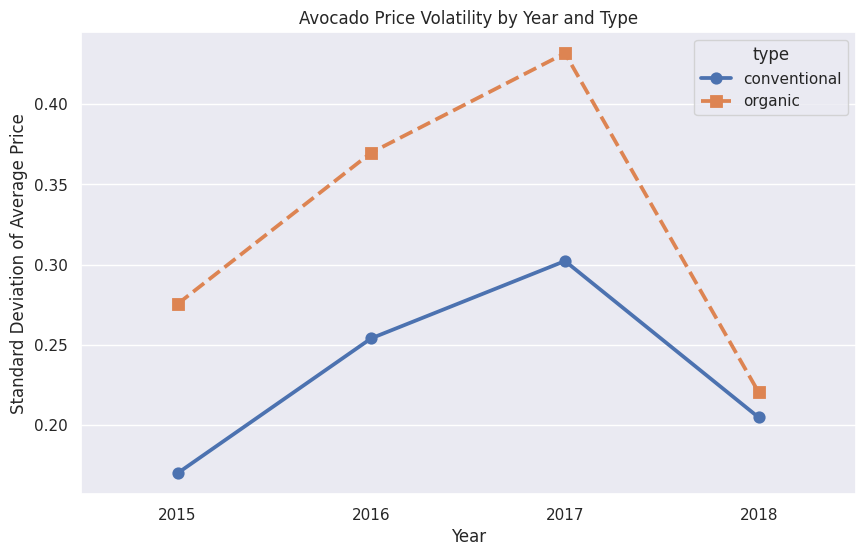

In [122]:
std_dev_df = df.groupby(['year', 'type'])['AveragePrice'].std().reset_index()
plt.figure(figsize=(10, 6))
sns.pointplot(x='year', y='AveragePrice', hue='type', data=std_dev_df, markers=['o', 's'], linestyles=['-', '--'])
plt.title('Avocado Price Volatility by Year and Type')
plt.xlabel('Year')
plt.ylabel('Standard Deviation of Average Price')
plt.show()

We can see that price volatility was as expected highest in 2017 for both conventional and organic avocados.

## Avocado demand per region

Let's see now the demand for avocados per region by plotting total volume sold for each region.
> We focus on West, South Central, Northeast, Southeast, Midsouth, Plains, Great Lakes as they are representative agglomerations of regions with enough data points.

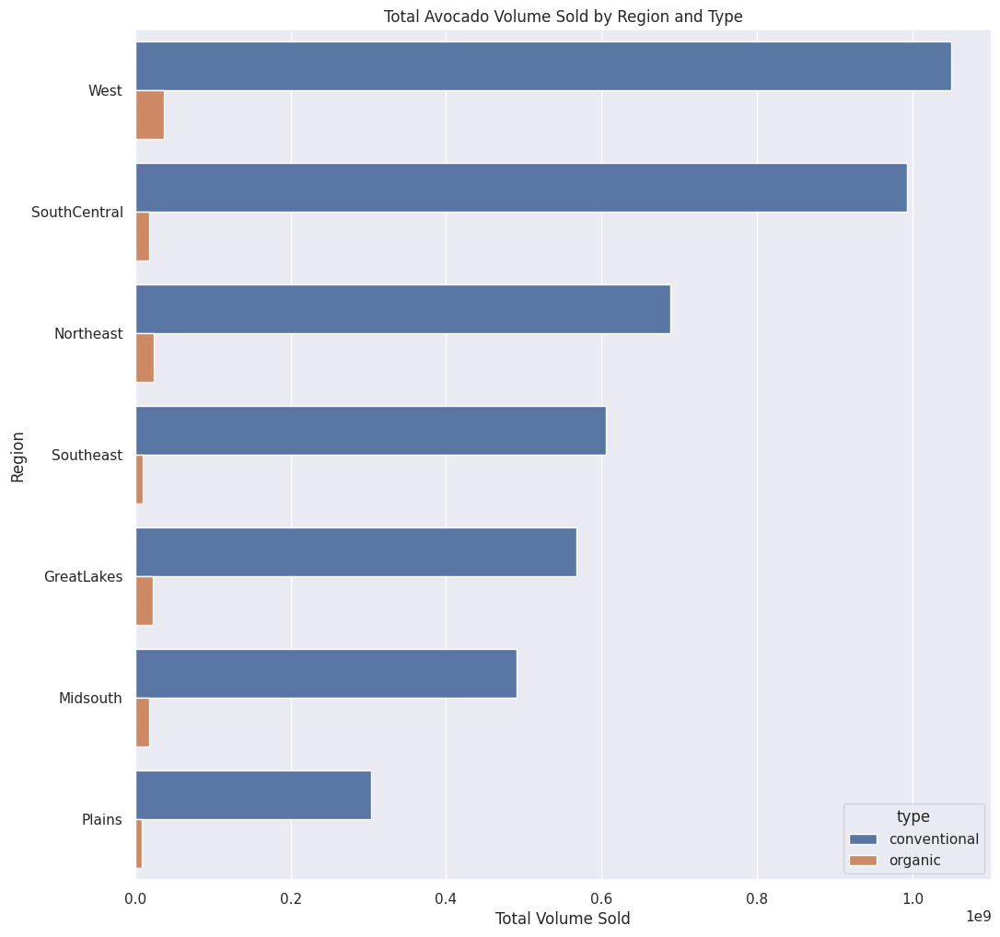

In [123]:
df_region = df [df['region'].isin(['West', 'SouthCentral', 'Northeast', 'Southeast', 'Midsouth', 'Plains', 'GreatLakes'])]
order = df_region.groupby('region')['Total Volume'].sum().sort_values(ascending=False).index
demand_df = df_region.groupby(['region', 'type'])['Total Volume'].sum().reset_index()
plt.figure(figsize=(12, 12))
sns.barplot(x='Total Volume', y='region', hue='type', data=demand_df, order=order)
plt.title('Total Avocado Volume Sold by Region and Type')
plt.xlabel('Total Volume Sold')
plt.ylabel('Region')
plt.show()

We can see West and South Central regions have the highest demand for avocados. Conventional avocados have higher demand than organic ones in all regions.

## Heatmap and handling multicollinearity

Let's see now the correlation heatmap of the numerical features and the categorical features encoded as numbers.

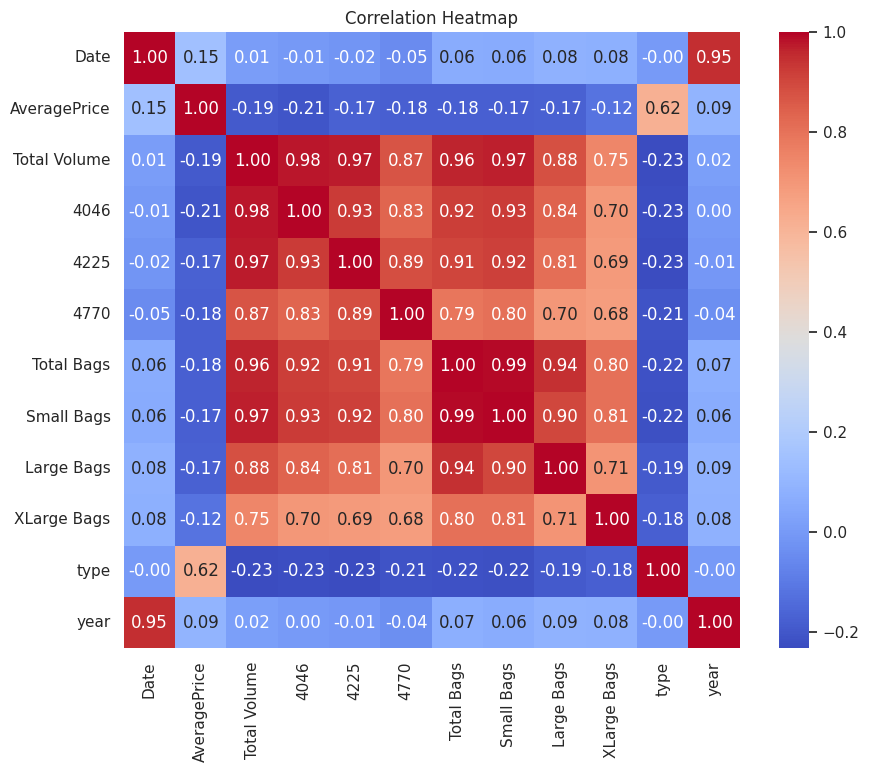

In [124]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df_encoded = df.copy()
df_encoded['type'] = le.fit_transform(df_encoded['type'])
# we drop temporarily region for correlation heatmap as it is categorical
# and has too many unique values
df_encoded_no_region = df_encoded.drop(columns=['region'])

plt.figure(figsize=(10, 8))
corr = df_encoded_no_region.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Heatmap')
plt.show()

Observations:
- **AveragePrice has a positive correlation with type** (organic avocados are more expensive), and **negative correlation with Total Volume and Total Bags** (higher sales volume is associated with lower prices).
- **Strong positive correlation between Total Volume and Total Bags**, as expected.
- **Total volume has less correlation with 4770 (extra-large variety) and XLarge bags**, indicating that these categories are **less popular**.
- **Strong correlation between small bags and total bags**, indicating that small bags are the **most common bag size** used for selling avocados. 
- **For Total volume, both 4046 (small/medium variety) and 4225 (large variety) have strong correlation**, indicating that both varieties are **equally popular** among consumers.
> Bag sizes have correlation between them. Same for avocado varieties. This could be a problem for predictive modeling due to multicollinearity.

A focused heatmap on Selected Features correlations shows the same insights more clearly.
> we drop date and year as they are not relevant for this analysis, we will use them later for time series analysis

> we use totals only for simplicity

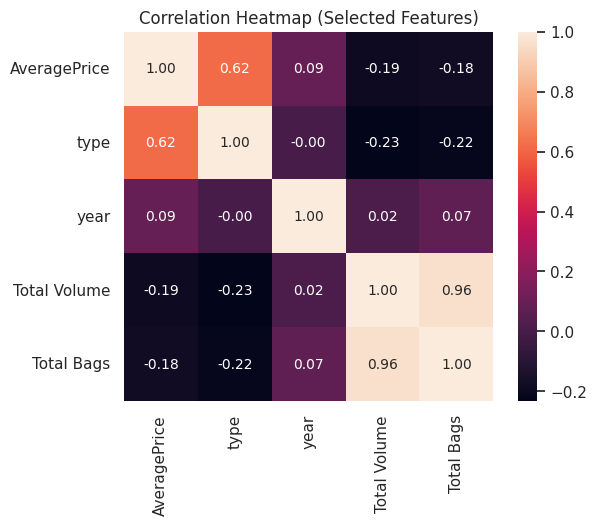

In [125]:
cols = ['AveragePrice', 'type', 'year', 'Total Volume', 'Total Bags']
cm = np.corrcoef(df_encoded[cols].values.T)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt=".2f", annot_kws={'size': 10},
                 yticklabels=cols, xticklabels=cols)
plt.title('Correlation Heatmap (Selected Features)')
plt.show()

After doing some research we conclude that:
- Bag sizes correlate because: They're all derived from the same "Total Bags", if you sell more total bags, you naturally sell more in each category. Small bags dominate, so they correlate most strongly with total.
- Avocado varieties (4046, 4225, 4770) correlate because: They all feed into "Total Volume", retailers typically stock multiple sizes simultaneously, so when overall demand is high, most sizes sell more.
So we have naturally multicollinearity among these features.

Our options before building predictive models are:
- Remove some of the correlated features (e.g., keep only Total Volume and Total Bags, and drop the individual bag sizes and varieties) This would simplify the model and eliminate multicollinearity, but we would lose some detailed information about bag sizes and varieties.
- Use dimensionality reduction techniques like PCA to combine correlated features into a smaller set of uncorrelated components.
- Use regularization techniques (like Ridge or Lasso regression) in predictive modeling to mitigate the impact of multicollinearity.

Let's start by validating the multicollinearity mathematically using VIF (Variance Inflation Factor)
- VIF < 5: No problem
- VIF 5-10: Moderate correlation (often acceptable)
- VIF > 10: High multicollinearity (problematic)

In [126]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_encoded[['Total Bags','Small Bags','Large Bags','XLarge Bags', 'Total Volume', '4046','4225','4770']]
vif = pd.DataFrame()
vif["feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif)

        feature           VIF
0    Total Bags  2.502000e+14
1    Small Bags  1.429714e+14
2    Large Bags  1.521486e+13
3   XLarge Bags  7.853860e+10
4  Total Volume  5.194565e+09
5          4046  6.923184e+08
6          4225  6.311271e+08
7          4770  4.956326e+06


In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_encoded[['Small Bags','Large Bags','XLarge Bags', '4046','4225','4770']]
vif = pd.DataFrame()
vif["feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif)

       feature        VIF
0   Small Bags  20.457434
1   Large Bags   5.804713
2  XLarge Bags   3.505955
3         4046  10.435894
4         4225  14.060881
5         4770   5.585092


After dropping Total Bags and Total Volumen the multicollinearity has improved for the other values, but Small Bags still correlated with the other bag sizes
4046, 4225 correlated with 4770.

We face several options:
- No changes:
    - VIF 10-15 is borderline but often acceptable in practice
Especially for tree-based models (Random Forest, XGBoost) which handle multicollinearity better
    - For linear regression, it might slightly inflate coefficient standard errors, but won't break predictions
- Create ratio features
    - E.g., Small Bags / Total Bags, 4046 / Total Volume
    - This can reduce multicollinearity by normalizing correlated features
    - But may lose interpretability
- Drop one more feature
We will follow the first option and keep the features as-is for now.

If we want to use region as a feature in predictive modeling, we need to encode it numerically. We already have clusters of regions based on their sales patterns, so we can use Binary Encoding or One-Hot Encoding, if the number of columns is manageable.

In [128]:
from category_encoders import BinaryEncoder, OneHotEncoder

# we create a new colum only with aggregated regions
df_clustered_regions = df_encoded[df_encoded['region'].isin(['West', 'SouthCentral', 'Northeast', 'Southeast', 'Midsouth', 'Plains', 'GreatLakes'])]

oe = OneHotEncoder(cols=['region'], use_cat_names=True)
df_final_encoded = oe.fit_transform(df_clustered_regions)

# be = BinaryEncoder(cols=['region'])
# df_final_encoded = be.fit_transform(df_clustered_regions)

df_final_encoded.dtypes

Date                   datetime64[ns]
AveragePrice                  float64
Total Volume                  float64
4046                          float64
4225                          float64
4770                          float64
Total Bags                    float64
Small Bags                    float64
Large Bags                    float64
XLarge Bags                   float64
type                            int64
year                            int64
region_GreatLakes               int64
region_Midsouth                 int64
region_Northeast                int64
region_Plains                   int64
region_SouthCentral             int64
region_Southeast                int64
region_West                     int64
dtype: object

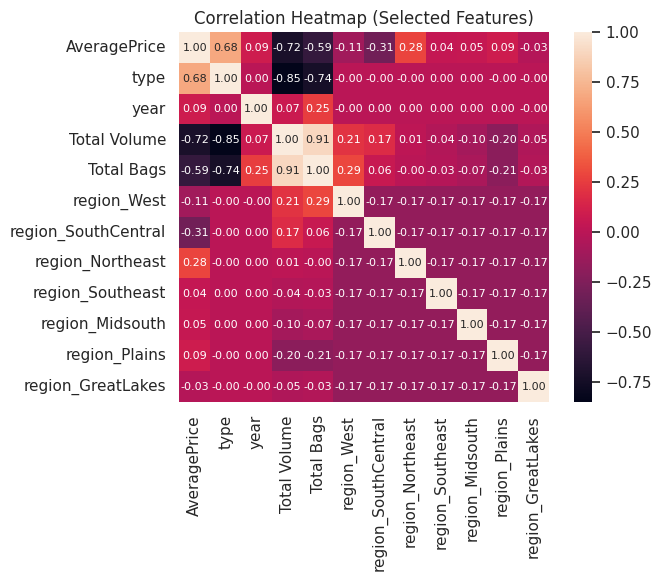

In [129]:
cols = ['AveragePrice', 'type', 'year', 'Total Volume', 'Total Bags', 'region_West', 'region_SouthCentral', 'region_Northeast', 'region_Southeast', 'region_Midsouth', 'region_Plains', 'region_GreatLakes']
cm = np.corrcoef(df_final_encoded[cols].values.T)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt=".2f", annot_kws={'size': 8},
                 yticklabels=cols, xticklabels=cols)
plt.title('Correlation Heatmap (Selected Features)')
plt.show()

Looking at the new heatmap with the clustered regions included, we can see that they don't have high correlation with other features. Depending of the predictive model we choose to use, we can include them as features without worrying about multicollinearity.

## Modeling and Prediction
- Prepare the data for modeling (train-test split, feature scaling if needed).
- Build regression models (e.g., Linear Regression, Random Forest, XGBoost) to predict AveragePrice.
- Evaluate model performance using metrics like RMSE, MAE, R².
- Tune hyperparameters to optimize model performance.
- Build classification models (e.g., Logistic Regression, Random Forest, KNN) to classify avocado type based on AveragePrice.
- Evaluate model performance using metrics like F1 score, Precision, Recall, ROC-AUC.

### Machine learning algorithms to consider:
- Linear Regression (least squares)
- Ridge/Lasso Regression (to handle multicollinearity)
- Decision Trees
- Random Forest
- Gradient Boosting (XGBoost, LightGBM)

#### Predicting AveragePrice


First, we will use linear regression to predict AveragePrice. Linear regression assumes that the features are normally distributed.
Let's check the skewness of Total Volume and Total Bags before and after log transformation to see if it helps in normalizing their distributions.
> We will use Total Volume and Total Bags as features.
> We can't use Date as it is not numerical, we will use Year and Month instead. We could consider also extracting day of week, is weekend, quarter, week of year, etc.

In [130]:
avg_df = df_final_encoded.drop(columns=['Date', 'Small Bags', 'Large Bags', 'XLarge Bags', '4046', '4225', '4770'])
print(avg_df.head())

     AveragePrice  Total Volume  Total Bags  type  year  region_GreatLakes  \
780          1.01    2580602.96   577490.50     0  2015                  1   
781          1.01    2504745.45   542059.05     0  2015                  1   
782          1.03    2608448.06   574072.01     0  2015                  1   
783          1.00    2981347.20   500758.99     0  2015                  1   
784          1.07    2198408.92   431502.68     0  2015                  1   

     region_Midsouth  region_Northeast  region_Plains  region_SouthCentral  \
780                0                 0              0                    0   
781                0                 0              0                    0   
782                0                 0              0                    0   
783                0                 0              0                    0   
784                0                 0              0                    0   

     region_Southeast  region_West  
780                 0    

In [131]:
print("Before transformation:")
print(f"Total Volume skewness: {avg_df['Total Volume'].skew():.4f}")
print(f"Total Bags skewness: {avg_df['Total Bags'].skew():.4f}")

# After log transformation (log1p to handle zero values)
print("\nAfter log transformation:")
print(f"Log Total Volume skewness: {np.log1p(avg_df['Total Volume']).skew():.4f}")
print(f"Log Total Bags skewness: {np.log1p(avg_df['Total Bags']).skew():.4f}")

Before transformation:
Total Volume skewness: 0.8413
Total Bags skewness: 1.6516

After log transformation:
Log Total Volume skewness: -0.0862
Log Total Bags skewness: -0.2250


Skewness > 1 or < -1 indicates a highly skewed distribution. So we will apply log transformation to Total Volume and Total Bags to reduce skewness.

In [132]:
avg_df['Log_Total_Volume'] = np.log1p(avg_df['Total Volume'])
avg_df['Log_Total_Bags'] = np.log1p(avg_df['Total Bags'])
avg_df = avg_df.drop(columns=['Total Volume', 'Total Bags'])

We build the model using the transformed features. We will evaluate the model using MAE, RMSE, and R² metrics.
MAE(Mean Absolute Error) measures the average magnitude of errors in a set of predictions, without considering their direction. It gives an idea of how wrong the predictions were. It treats all errors equally, so it is less sensitive to outliers.
RMSE(Root Mean Squared Error) measures the square root of the average squared differences between predicted and actual values. It gives a higher weight to larger errors, making it more sensitive to outliers compared to MAE.
> Both are in the same units as the target variable (AveragePrice), making them interpretable in terms of dollars.
R² (R-squared) measures the proportion of variance in the dependent variable (AveragePrice) that can be explained by the independent variables (features) in the model. It ranges from 0 to 1, with higher values indicating a better fit.

In [133]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = avg_df.drop(columns=['AveragePrice'])
y = avg_df['AveragePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print("Linear Regression Performance:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R^2: {r2:.4f}")

Linear Regression Performance:
MAE: 0.1328
RMSE: 0.1733
R^2: 0.7454


- MAE: 0.1264 indicates that on average, our model's predictions are off by about $0.1264.
- RMSE: 0.1751 indicates that the standard deviation of the prediction errors is about $0.1751. It's bigger than MAE as it penalizes larger errors more heavily.
- R² is 0.7742 indicates that approximately 77.42% of the variance in AveragePrice can be explained by the model's features.

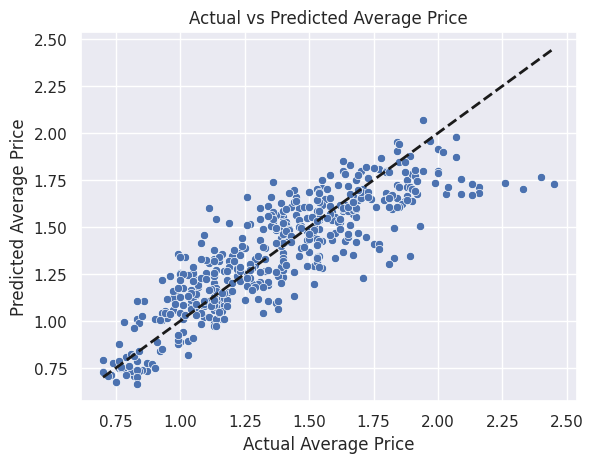

In [134]:
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel('Actual Average Price')
plt.ylabel('Predicted Average Price')
plt.title('Actual vs Predicted Average Price')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

We check residuals to validate model assumptions.

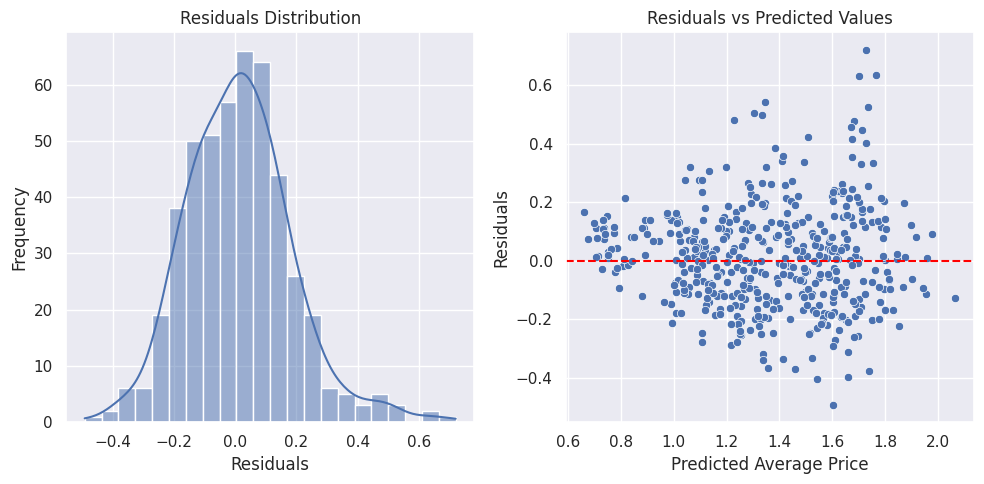

In [135]:
residuals = y_test - y_pred
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Average Price')
plt.ylabel('Residuals')
plt.tight_layout()
plt.show()

In [136]:
print("="*60)
print("RESIDUAL ANALYSIS")
print("="*60)
print(f"Residuals mean: {residuals.mean():.6f} (should be ~0)")
print(f"Residuals std: {residuals.std():.4f} (should be close RMSE: {rmse:.4f})")
print(f"Residuals skewness: {residuals.skew():.4f} (should be > -1 and < 1)")
print(f"Residuals min: {residuals.min():.4f} (Largest underestimation)")
print(f"Residuals max: {residuals.max():.4f} (Largest overestimation)")

RESIDUAL ANALYSIS
Residuals mean: 0.012871 (should be ~0)
Residuals std: 0.1730 (should be close RMSE: 0.1733)
Residuals skewness: 0.5369 (should be > -1 and < 1)
Residuals min: -0.4918 (Largest underestimation)
Residuals max: 0.7204 (Largest overestimation)


The residuals have a mean close to 0, which is good. The standard deviation of the residuals is close to the RMSE, indicating that the spread of the residuals is consistent with the overall prediction error. The skewness of the residuals is within acceptable limits, suggesting that they are approximately normally distributed. The minimum and maximum residuals indicate the largest underestimation and overestimation by the model, respectively.

We will try now Random Forest to see if we can improve the model performance.

In [137]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_y_pred = rf.predict(X_test)
rf_mae = mean_absolute_error(y_test, rf_y_pred)
rf_mse = mean_squared_error(y_test, rf_y_pred)
rf_rmse = np.sqrt(rf_mse)
rf_r2 = r2_score(y_test, rf_y_pred)
print("Random Forest Regression Performance:")
print(f"MAE: {rf_mae:.4f}")
print(f"RMSE: {rf_rmse:.4f}")
print(f"R^2: {rf_r2:.4f}")

Random Forest Regression Performance:
MAE: 0.0929
RMSE: 0.1379
R^2: 0.8388


- MAE: 0.0929 indicates that on average, our Random Forest model's predictions are off by about $0.0929.
- RMSE: 0.1379 indicates that the standard deviation of the prediction errors is about $0.1379.
- R² is 0.8543 indicates that approximately 85.43% of the variance in AveragePrice can be explained by the Random Forest model's features.

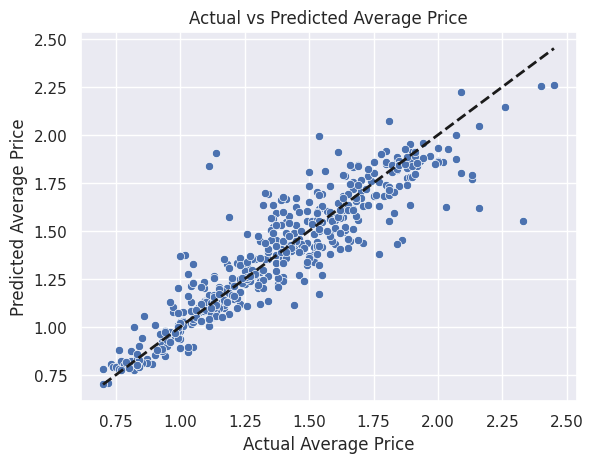

In [138]:
sns.scatterplot(x=y_test, y=rf_y_pred)
plt.xlabel('Actual Average Price')
plt.ylabel('Predicted Average Price')
plt.title('Actual vs Predicted Average Price')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()  

We check residuals to validate model assumptions.

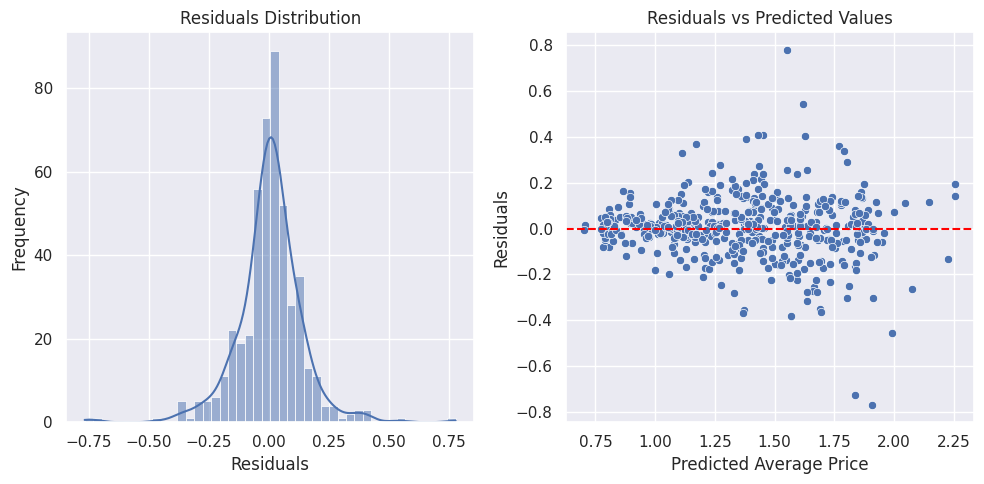

In [139]:
residuals = y_test - rf_y_pred
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.subplot(1, 2, 2)
sns.scatterplot(x=rf_y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Average Price')
plt.ylabel('Residuals')
plt.tight_layout()
plt.show()

In [140]:
print("="*60)
print("RESIDUAL ANALYSIS")
print("="*60)
print(f"Residuals mean: {residuals.mean():.6f} (should be ~0)")
print(f"Residuals std: {residuals.std():.4f} (should be close RMSE: {rf_rmse:.4f})")
print(f"Residuals skewness: {residuals.skew():.4f} (should be > -1 and < 1)")
print(f"Residuals min: {residuals.min():.4f} (Largest underestimation)")
print(f"Residuals max: {residuals.max():.4f} (Largest overestimation)")

RESIDUAL ANALYSIS
Residuals mean: 0.004804 (should be ~0)
Residuals std: 0.1379 (should be close RMSE: 0.1379)
Residuals skewness: -0.2599 (should be > -1 and < 1)
Residuals min: -0.7672 (Largest underestimation)
Residuals max: 0.7785 (Largest overestimation)


We can see that Random Forest outperforms Linear Regression in all metrics, indicating it is a better model for predicting AveragePrice in this case.
- R^2 increased from 0.7742 to 0.8543, showing that Random Forest explains more variance in AveragePrice.
- MAE and RMSE decreased, indicating more accurate predictions.
- Residual analysis shows that the residuals have a mean close to zero, a standard deviation close to the RMSE, and a skewness within acceptable limits, suggesting that the model's errors are reasonably well-behaved.

#### Classification of avocado types

We will build a classification model to predict the type of avocado (conventional vs. organic) based on AveragePrice. First we will use Logistic Regression as a baseline model and then we will try Random Forest Classifier to see if we can improve the performance.

To measure the performance of the classification model, we will use the following metrics:
- Accuracy: Proportion of correct predictions (both true positives and true negatives) out of all predictions.
- Precision: Proportion of true positive predictions out of all positive predictions made by the model.
- Recall: Proportion of true positive predictions out of all actual positive instances in the data.
- F1-Score: Harmonic mean of precision and recall, providing a single metric that balances both. It's calculated at a fixed decision threshold (usually 0.5 for binary classification).
- Average Precision Score: Summary metric that combines precision and recall across different thresholds, providing a single value to evaluate the model's performance.
- Confusion Matrix: A table that summarizes the performance of the classification model:
```
                Predicted
             | Conv | Org  |
        --------------------
        Conv |  TN  |  FP  |
 Actual --------------------
        Org  |  FN  |  TP  |
```
Where:
- TN (True Negatives): Number of conventional avocados correctly classified as conventional.
- FP (False Positives): Number of conventional avocados incorrectly classified as organic.
- FN (False Negatives): Number of organic avocados incorrectly classified as conventional.
- TP (True Positives): Number of organic avocados correctly classified as organic.

In [185]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, average_precision_score

features = ['AveragePrice']
X = df_final_encoded[features]
y = df_final_encoded['type']  # 0 for conventional, 1 for organic
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=42)
log_reg = LogisticRegression(penalty='l2', tol=0.0001, solver='lbfgs').fit(X_train, y_train)
y_pred = log_reg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
avg_precision = average_precision_score(y_test, log_reg.predict_proba(X_test)[:, 1])
print("Logistic Regression Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Average Precision Score: {avg_precision:.4f}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"LogisticRegression train data score: {log_reg.score(X_train, y_train):.4f}")
print(f"LogisticRegression test data score: {log_reg.score(X_test, y_test):.4f}")

Logistic Regression Performance:
Accuracy: 0.8294
Precision: 0.8208
Recall: 0.8456
F1 Score: 0.8331
Average Precision Score: 0.8977
Confusion Matrix:
[[239  55]
 [ 46 252]]
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.81      0.83       294
           1       0.82      0.85      0.83       298

    accuracy                           0.83       592
   macro avg       0.83      0.83      0.83       592
weighted avg       0.83      0.83      0.83       592

LogisticRegression train data score: 0.8377
LogisticRegression test data score: 0.8294


- Accuracy: 0.8294 indicates that the Logistic Regression model correctly predicts the type of avocado (conventional vs. organic) about 82.94% of the time based on AveragePrice alone.
- Precision: 0.8208 indicates that when the model predicts an avocado is organic, it is correct about 82.08% of the time.
- Recall: 0.8456 indicates that the model correctly identifies 84.56% of all organic avocados.
- F1-Score: 0.8331 is the harmonic mean of precision and recall, providing a single metric that balances both. An F1-score of 0.8331 indicates a good balance between precision and recall for the Logistic Regression model in classifying avocado types.
- Confusion Matrix:
    - True Positives (TP): 239 avocados were correctly classified as conventional.
    - True Negatives (TN): 252 avocados were correctly classified as organic.
    - False Positives (FP): 46 conventional avocados were incorrectly classified as organic.
    - False Negatives (FN): 44 organic avocados were incorrectly classified as conventional.
- Logistic Regression train data score: 0.8377 and test data score: 0.8294 indicates that the model generalizes well to unseen data, with similar performance on both training and test sets.

Let's compare now with Random Forest Classifier.

Random Forest Classifier Performance:
Accuracy: 0.8226
Precision: 0.8227
Recall: 0.8255
F1 Score: 0.8241
Average Precision Score: 0.8746
[[241  53]
 [ 52 246]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82       294
           1       0.82      0.83      0.82       298

    accuracy                           0.82       592
   macro avg       0.82      0.82      0.82       592
weighted avg       0.82      0.82      0.82       592

Random Forest Classifier train data score: 0.8455
Random Forest Classifier test data score: 0.8226


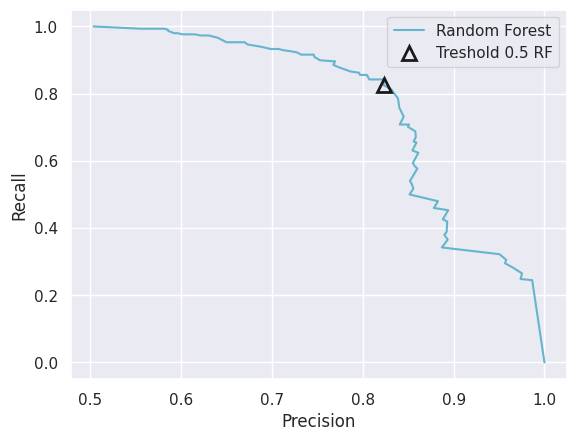

In [186]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve

rf = RandomForestClassifier(n_estimators=100, random_state=42).fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
avg_precision_rf = average_precision_score(y_test, rf.predict_proba(X_test)[:, 1])
print("Random Forest Classifier Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Average Precision Score: {avg_precision_rf:.4f}")
print(f"{confusion_matrix(y_test, y_pred)}")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(f"Random Forest Classifier train data score: {rf.score(X_train, y_train):.4f}")
print(f"Random Forest Classifier test data score: {rf.score(X_test, y_test):.4f}")
precision_rf, recall_rf, thresholds_rf = precision_recall_curve(y_test, rf.predict_proba(X_test)[:, 1])

plt.plot(precision_rf, recall_rf, label='Random Forest', color='c')
close_default_rf = np.argmin(np.abs(thresholds_rf - 0.5))
plt.plot(precision_rf[close_default_rf],
        recall_rf[close_default_rf],'^',c = 'k', markersize = 10,
        label = "Treshold 0.5 RF", fillstyle = "none", mew = 2)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc = "best")

Summary:
- F1 score: LR slightly better than RF (0.8331 vs 0.8241)
- Avg Precision: LR slightly better than RF (0.898 vs 0.875)

So overall, Logistic Regression performs slightly better than Random Forest Classifier for predicting avocado types based on AveragePrice alone. Let's use ROC curve to evaluate the Random Forest Classifier performance.

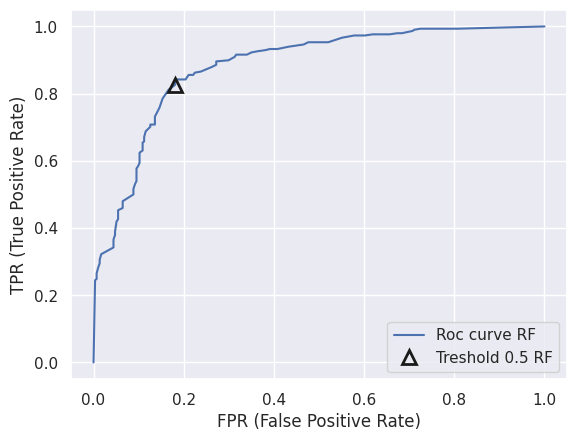

In [190]:
from sklearn.metrics import roc_curve

fpr_rf,tpr_rf,thresholds_rf = roc_curve(y_test,rf.predict_proba(X_test)[:,1])
plt.plot(fpr_rf,tpr_rf, label = "Roc curve RF")

plt.xlabel("FPR (False Positive Rate)")
plt.ylabel("TPR (True Positive Rate)")

close_default_rf = np.argmin(np.abs(thresholds_rf - 0.5))
plt.plot(fpr_rf[close_default_rf],
        tpr_rf[close_default_rf],'^', markersize = 10,
        label = "Treshold 0.5 RF", fillstyle = "none", c = 'k', mew = 2)
plt.legend(loc = 4)

Let's see if the feature is roughly linearly separable.

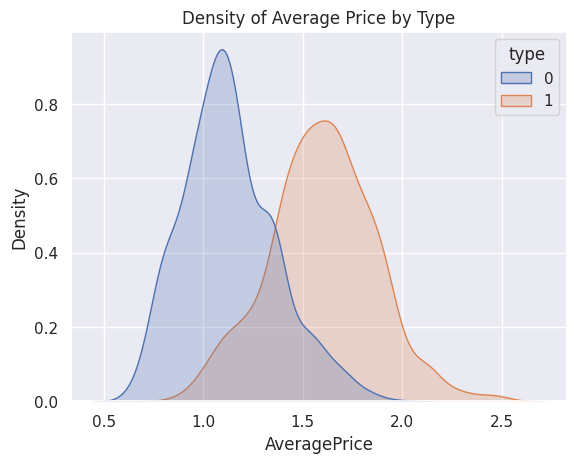

In [ ]:
sns.kdeplot(data=df_final_encoded, x='AveragePrice', hue='type', fill=True)
plt.title('Density of Average Price by Type')
plt.show()

Lastly, we cross-validate the Logistic Regression model to ensure its robustness. We will visualize the cross-validation results using ROC curve.

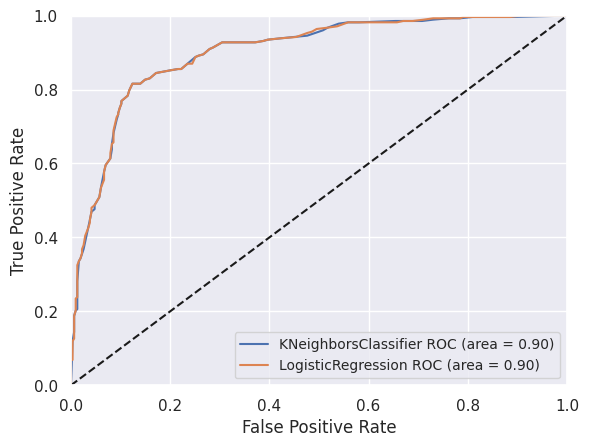

In [201]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc


kfold = 7 
result = {} 
trn_train, trn_test, trg_train, trg_test = train_test_split(X, y, test_size=0.25) 
knn = KNeighborsClassifier(n_neighbors = 200) 
log_reg = LogisticRegression(penalty='l2', tol=0.001) 
scores = cross_val_score(knn, X, y, cv = kfold)
result['KNeighborsClassifier'] = scores.mean()
scores = cross_val_score(log_reg, X, y, cv = kfold)
result['LogisticRegression'] = scores.mean()
plt.clf()

knn_result = knn.fit(trn_train, trg_train).predict_proba(trn_test)
fpr, tpr, thresholds = roc_curve(trg_test, knn_result[:, 1])
roc_auc  = auc(fpr, tpr)
plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % ('KNeighborsClassifier',roc_auc))

logreg_result = log_reg.fit(trn_train, trg_train).predict_proba(trn_test)
fpr, tpr, thresholds = roc_curve(trg_test, logreg_result[:, 1])
roc_auc  = auc(fpr, tpr)
plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % ('LogisticRegression',roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=0, fontsize='small')

This confirms that our Logistic Regression model is robust and performs consistently well across different subsets of the data for classifying avocado types based on AveragePrice. We could try other features and see if the performance improves or RF performs better than LR.